In [1]:
import time
from pathlib import Path
import pandas as pd
import scanpy as sc
import anndata as ad
from matplotlib import pyplot as plt
import re
import sys
import session_info

In [2]:
plt.rcParams['figure.dpi'] = 150
plt.rcParams['figure.figsize'] = (3,3)

In [3]:
# Directories
base_dir = Path("/home/workspace/private/projects/kim/drg")
data_dir = base_dir / "data" / "scrna-seq"
input_dir = data_dir / "h5ad" / "04_clustered"

output_dir = data_dir / "markers"

output_dir.mkdir(parents = True, exist_ok = True)

In [4]:
adata = sc.read_h5ad(input_dir / "GSE139088-scvi-leiden.h5ad")

# Wilcoxon DE on author annotations

In [5]:
adata.obs.columns

Index(['original_annotation', 'GSE', 'GSM', 'sample_number', 'sample_id',
       'experiment_id', 'n_genes_by_counts', 'total_counts', 'total_counts_mt',
       'pct_counts_mt', 'total_counts_ribosomal', 'pct_counts_ribosomal',
       'doublet_scores', 'predicted_doublets', '_scvi_batch', '_scvi_labels',
       'leiden'],
      dtype='object')

In [6]:
sc.tl.rank_genes_groups(adata, groupby='original_annotation', method='wilcoxon')
df = sc.get.rank_genes_groups_df(adata, group = None)
df

/home/workspace/environment/sc-spatial/lib/python3.12/site-packages/numpy/core/fromnumeric.py:86: FutureWarning: The behavior of DataFrame.sum with axis=None is deprecated, in a future version this will reduce over both axes and return a scalar. To retain the old behavior, pass axis=0 (or do not pass axis)
  return reduction(axis=axis, out=out, **passkwargs)
/home/workspace/environment/sc-spatial/lib/python3.12/site-packages/scanpy/get/get.py:69: FutureWarning: The previous implementation of stack is deprecated and will be removed in a future version of pandas. See the What's New notes for pandas 2.1.0 for details. Specify future_stack=True to adopt the new implementation and silence this warning.
  d = d.stack(level=1).reset_index()


,group,names,scores,logfoldchanges,pvals,pvals_adj
0,Abeta-Field,Cntn1,25.320244,7.051589,1.912032e-141,4.000736e-137
1,Abeta-Field,Nefh,24.995878,5.361016,6.777963e-138,7.091105e-134
2,Abeta-Field,Tmem56,23.948195,5.478737,9.649114e-127,5.047452e-123
3,Abeta-Field,Nefm,23.917501,3.902427,2.014074e-126,8.428498e-123
4,Abeta-Field,Thy1,23.618092,8.041372,2.512469e-123,7.510129e-120
...,...,...,...,...,...,...
334779,Unknown,Tshz2,-11.783167,-2.116950,4.766773e-32,3.989599e-29
334780,Unknown,Atp1b3,-11.817682,-2.453760,3.162918e-32,2.757538e-29
334781,Unknown,Kcnb2,-11.908137,-3.578214,1.073487e-32,1.020984e-29
334782,Unknown,Ppp1r1c,-12.495124,-2.803930,7.937224e-36,1.186275e-32


In [7]:
top_genes = {}

for group in sorted(adata.obs['original_annotation'].unique()):
    top_genes[group] = (
        df[df['group'] == group]
        .sort_values('scores', ascending=False)
        .head(5)['names']
        .tolist()
    )

print(top_genes)

{'Abeta-Field': ['Cntn1', 'Nefh', 'Tmem56', 'Nefm', 'Thy1'], 'Abeta-RA-LTMR': ['Nefm', 'Nefl', 'Endod1', 'Atp1b1', 'Cplx1'], 'Adelta-LTMR': ['Cadps2', 'Prkar1a', 'Ntrk2', 'Cox4i1', 'Cox5a'], 'C-LTMR': ['Gm7271', 'Iqsec2', 'Fam19a4', 'Rarres1', 'P2ry1'], 'CGRP-Alpha': ['Nrsn1', '6330403K07Rik', 'Syt4', 'Jun', 'Adcyap1'], 'CGRP-Beta': ['Csrp2', '6330403K07Rik', 'Ahi1', 'Fxyd6', 'Dcn'], 'CGRP-Epsilion': ['Tac1', 'Calca', 'Lcorl', 'Tagln2', 'Cdhr1'], 'CGRP-Eta': ['Thy1', 'Fgf12', 'Paqr9', 'Ngfr', 'Cplx2'], 'CGRP-Gamma': ['Vat1l', 'Ngfr', 'Arhgdig', 'Rims3', 'Celf4'], 'CGRP-Theta': ['Smyd3', 'Mrgpra3', 'Gfra1', 'Rgs4', 'Gda'], 'CGRP-Zeta': ['Hopx', 'Thy1', 'Prkcb', 'S100b', 'Ywhag'], 'Nonpeptidergic nociceptors': ['Mrgprd', 'Cd24a', 'Ctxn3', 'Lpar3', 'Cd55'], 'Proprioceptors': ['Pvalb', 'Clec2l', 'Cntnap2', 'Snap25', 'Serpini1'], 'Sst': ['Jak1', 'Osmr', 'Nppb', 'Npy2r', 'Adk'], 'TrpM8': ['Meg3', 'Chchd10', 'Snhg11', 'Malat1', 'Rprm'], 'Unknown': ['Atf3', 'Gadd45a', 'Hn1', 'Cdkn1a', 'Sox11']

/home/workspace/environment/sc-spatial/lib/python3.12/site-packages/scanpy/plotting/_dotplot.py:168: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  obs_bool.groupby(level=0).sum() / obs_bool.groupby(level=0).count()
/home/workspace/environment/sc-spatial/lib/python3.12/site-packages/scanpy/plotting/_dotplot.py:178: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  dot_color_df = self.obs_tidy.groupby(level=0).mean()
/home/workspace/environment/sc-spatial/lib/python3.12/site-packages/scanpy/plotting/_dotplot.py:747: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  

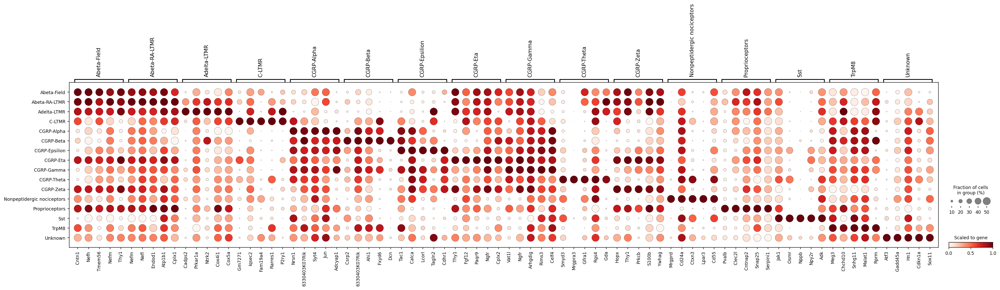

In [8]:
# Dotplot
sc.pl.dotplot(
    adata,
    var_names=top_genes,
    groupby='original_annotation',
    standard_scale='var', 
    dot_max=0.5,            
    show=True,
    colorbar_title = 'Scaled to gene'
)

In [9]:
top_genes_records = []

for group in sorted(adata.obs['original_annotation'].unique()):
    top_genes_df = (
        df[df['group'] == group]
        .sort_values('scores', ascending=False)
        .head(10)
    )
    for i, row in top_genes_df.iterrows():
        top_genes_records.append({
            'cell_type': group,
            'gene': row['names'],
            'score': row['scores'],
            'logfoldchange': row['logfoldchanges'],
            'pval_adj': row['pvals_adj']
        })

# Convert to DataFrame
top_genes_df = pd.DataFrame(top_genes_records)


print(top_genes_df.head(20))

        cell_type    gene      score  logfoldchange       pval_adj
0     Abeta-Field   Cntn1  25.320244       7.051589  4.000736e-137
1     Abeta-Field    Nefh  24.995878       5.361016  7.091105e-134
2     Abeta-Field  Tmem56  23.948195       5.478737  5.047452e-123
3     Abeta-Field    Nefm  23.917501       3.902427  8.428498e-123
4     Abeta-Field    Thy1  23.618092       8.041372  7.510129e-120
5     Abeta-Field  Atp1b1  23.458611       3.976768  2.824170e-118
6     Abeta-Field    Nefl  23.368530       2.017396  1.557500e-117
7     Abeta-Field   Scn7a  22.796900       2.845911  6.865262e-112
8     Abeta-Field   Nptx1  22.642199       6.379467  2.049694e-110
9     Abeta-Field   Fxyd7  22.524294       6.290280  2.789378e-109
10  Abeta-RA-LTMR    Nefm  27.013927       4.697338  2.121797e-156
11  Abeta-RA-LTMR    Nefl  26.767696       2.473531  8.040261e-154
12  Abeta-RA-LTMR  Endod1  26.611433       4.697656  2.618383e-152
13  Abeta-RA-LTMR  Atp1b1  26.552080       4.374959  1.016930e

In [10]:
#top_genes_df.to_csv(output_dir / "top3_genes_per_neuron_celltype.csv", index=False)

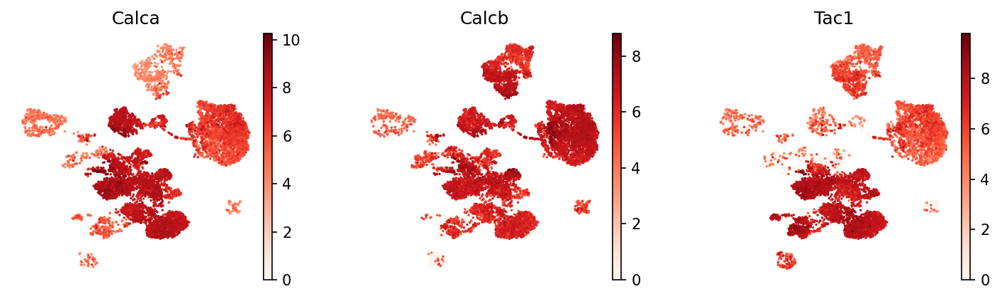

In [22]:
sc.pl.umap(adata, color = ['Calca', 'Calcb', 'Tac1'], frameon = False, cmap = 'Reds')

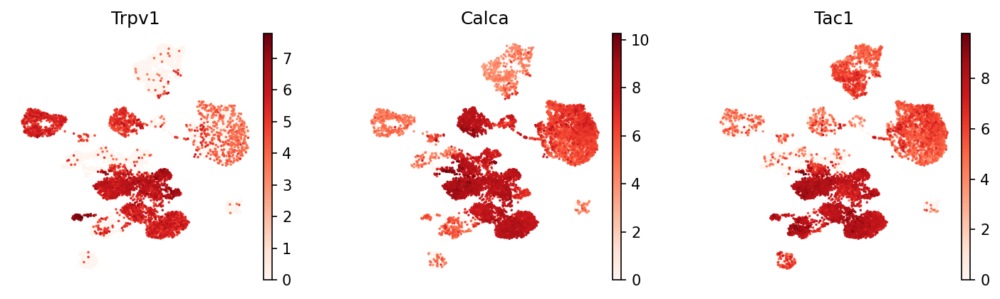

In [23]:
sc.pl.umap(adata, color = ['Trpv1', 'Calca', 'Tac1'], frameon = False, cmap = 'Reds')

/home/workspace/environment/sc-spatial/lib/python3.12/site-packages/scanpy/plotting/_tools/scatterplots.py:1234: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
/home/workspace/environment/sc-spatial/lib/python3.12/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


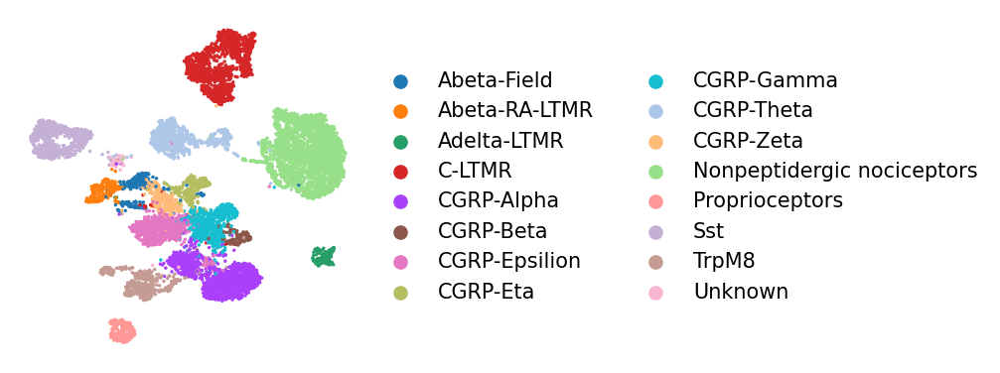

In [15]:
sc.pl.umap(adata, color = "original_annotation", frameon = False, title = '')

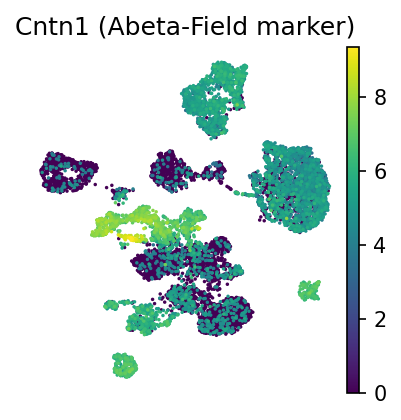

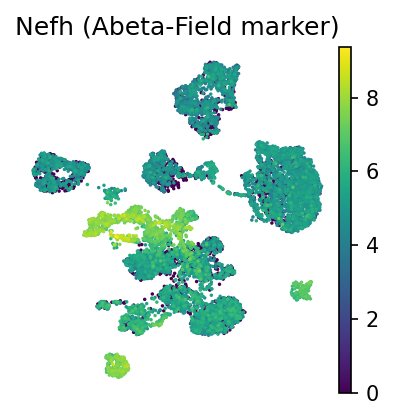

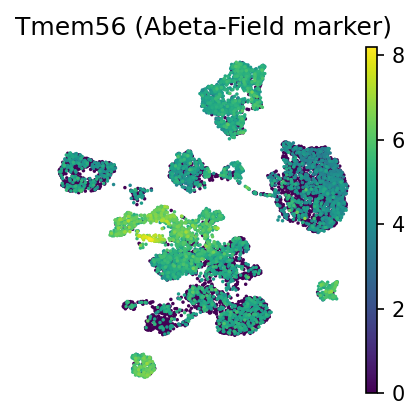

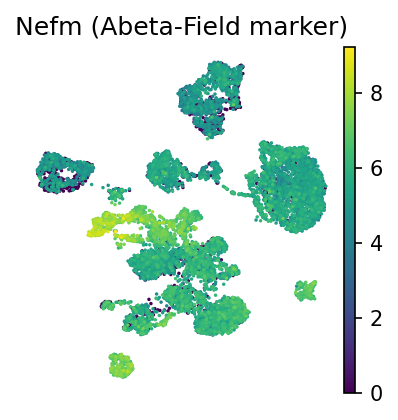

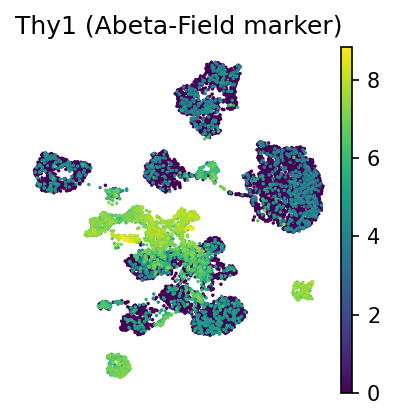

...

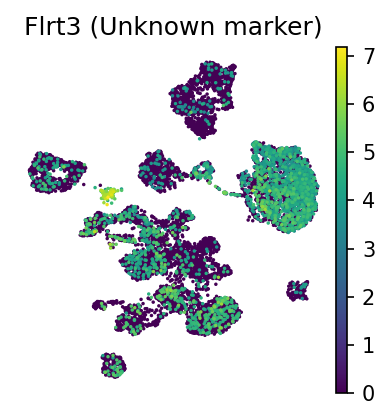

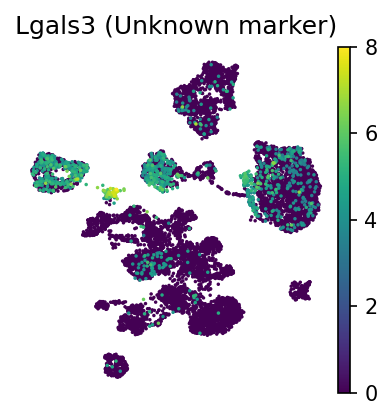

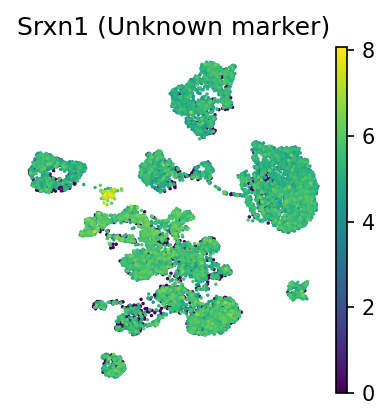

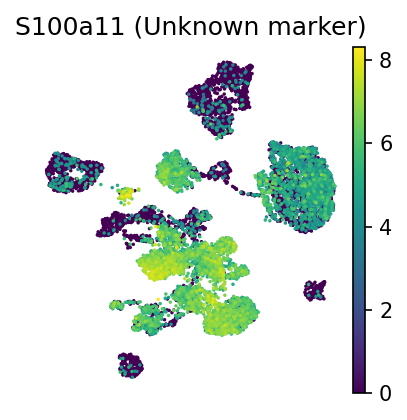

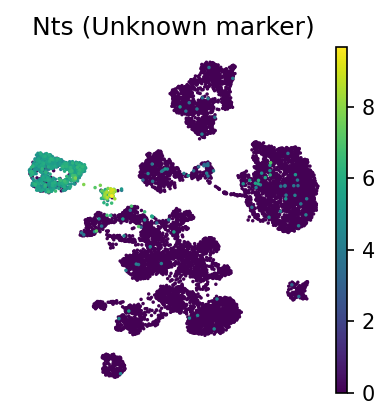

In [12]:
for _, row in top_genes_df.iterrows():
    gene = row['gene']
    cell_type = row['cell_type']
    sc.pl.umap(
        adata,
        color=gene,
        title=f"{gene} ({cell_type} marker)",
        frameon = False,
        show=True
    )